# Part I
Background 
You are given the Data_Files excel sheet which contains information about potatoes, the company's clients, and a snapshot of client potato positions for a period of time. A quantity of Null represents no position. Management has some questions regarding these data and would like to know your interpretations. You will present your findings at the quarterly management meeting

In [10]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [129]:
#read data
data=pd.ExcelFile("/Users/suedy/Downloads/2_Data_Files.xlsx")
potato_info=pd.read_excel(data,"Potatoes_Info")
client_info=pd.read_excel(data,"Client_Info")
position=pd.read_excel(data,"Potatoes_Positions")

In [12]:
potato_info.head()

,Product ID,Variety Name,Country,Shape of tuber,Colour of skin,Colour of flesh,Depth of eyes,Smoothness of skin,Colour of base of lightsprout,Maturity,Height of plants,Frequency of berries
0,1,Accent,NETHERLANDS,Short - oval,Cream,Light yellow,Shallow - medium,Medium,Pink,Very early to early,Short,Absent
1,2,Accord,NETHERLANDS,Short - oval,Cream,Cream,Shallow,-,Pink,Early,Medium,Few
2,3,Adora,-,Oval,Yellow,Light yellow,Shallow - medium,Smooth,-,First Early,-,Few
3,4,Agria,-,Oval - long,Cream,Deep yellow,Shallow,Medium,Blue,Intermediate,-,Absent
4,5,Almera,-,Oval - long,Cream,Light yellow,Very shallow - shallow,Smooth,Pink,Early,Medium - tall,Medium


In [13]:
client_info.head()

,Client ID,First Name,Last Name,Client Type,Client Location
0,52,Larita,Albright,Industrial,West
1,27,Destiny,Aldridge,Industrial,Midwest
2,62,Mana,Baron,Organic,West
3,70,Milagros,Barrera,Organic,North
4,15,Carmina,Battle,Organic,Northeast


In [14]:
position.head()

,Date,Client ID,Product ID,Price,Quantity
0,2020-05-01,38,131,12.02,7
1,2020-05-01,64,131,12.02,52
2,2020-05-01,74,131,12.02,[NULL]
3,2020-05-01,74,14,12.43,31
4,2020-05-01,50,14,12.43,103


# Which clients have the largest potato stockpile based on market value? 
1. Greate new column "Market Value" to show market value (price*quantity) for each record
2. Greate new column "Daily_total_value_client" to show the daily total stockpile per each customer per day
3. Find out the client who get the highest market value per day
4. Based on the result, client 82, 27 and 38 have the largest value, and especially client 38 has largest value in marjority days
5. Give out client information based on the client id

In [130]:
position['Quantity'].replace('[NULL]',0,inplace = True) #replace all null in Quantity with 0
position["Market Value"]=position["Price"]*position["Quantity"]
position["Daily_total_value_client"]=position.groupby(["Date","Client ID"])['Market Value'].transform(sum)

In [131]:
client_largest_stockpile=list(position.loc[position.groupby(["Date"])['Daily_total_value_client'].idxmax(),"Client ID"])
for client in list(set(client_largest_stockpile)):
    print ("Client ID {} : {}".format(client,client_largest_stockpile.count(client)))

Client ID 82 : 1
Client ID 27 : 2
Client ID 38 : 84


In [132]:
client_info[client_info["Client ID"].isin(list(set(client_largest_stockpile)))]

,Client ID,First Name,Last Name,Client Type,Client Location
1,27,Destiny,Aldridge,Industrial,Midwest
14,38,Jamel,Caruso,Industrial,Midwest
15,82,Samuel,Cheney,Organic,Northeast


# Which clients are the most active?
1. Create new column "count_client", which count the number of records per customer per day
2. Find out the client with highest count (represent active) per day
3. Based on the result, Client 38, 50 are most active, especailly 38 has been active for most days
4. Give out client information based on the client id

In [133]:
position["count_client"]=position.groupby(["Date","Client ID"])["Product ID"].transform("count")
client_active=list(position.loc[position.groupby(["Date"])['count_client'].idxmax(),"Client ID"])
for client in list(set(client_active)):
    print ("Client ID {} : {}".format(client,client_active.count(client)))

In [135]:
client_info[client_info["Client ID"].isin(list(set(client_active)))]

,Client ID,First Name,Last Name,Client Type,Client Location
14,38,Jamel,Caruso,Industrial,Midwest
54,50,Landon,Kyle,Hydroponitc,North


# Which potatoes are most activity traded?
1. Create new column "count_potato", which count the number of records per product per day
2. Find out the potato with highest count (represent active) per day
3. Based on the result, Product 16, 172, 45 are most active, especailly 16 has been active for most days
4. Give out potato information based on the product id

In [136]:
position["count_potato"]=position.groupby(["Date","Product ID"])["Client ID"].transform("count")
potato_active=list(position.loc[position.groupby(["Date"])['count_potato'].idxmax(),"Product ID"])
for potato in list(set(potato_active)):
    print ("Product ID {} : {}".format(potato,potato_active.count(potato)))

Product ID 16 : 58
Product ID 172 : 24
Product ID 45 : 5


In [137]:
potato_info[potato_info["Product ID"].isin(list(set(potato_active)))]

,Product ID,Variety Name,Country,Shape of tuber,Colour of skin,Colour of flesh,Depth of eyes,Smoothness of skin,Colour of base of lightsprout,Maturity,Height of plants,Frequency of berries
15,16,Argos,UNITED KINGDOM,Oval - long,Cream,Cream,Shallow,Smooth,Blue,Intermediate to late,Medium,Few
44,45,British Queen,-,Short - oval,Cream,Cream,Shallow - medium,Medium,Pink,Early to intermediate,-,Few
171,172,Lorimer,UNITED KINGDOM,Short - oval,White,Cream,Shallow,-,Blue,-,Short - medium,-


# What client activity trends do you see?
1. the number of activity per client each day
<br>
There are four types of client activity trends
<br>
Type1: steady and highly active (Client 38)
<br>
Type2: unsteady and lowly active (Client 50,27)
<br>
Type3: steady and lowly active (Most Client)
2. the daily total market value per client each day
<br>
Type1: steady market value
<br>
Type2: unsteady market value with extreme market value(Client 27)
3. the average market value based on clients per day
<br>
The type2 clients in second point influence the average market value greatly
4. the average number of activity based on clients per day
<br>
May-Jun: low volatility
<br>
Jun-Aug: high volatility
<br>
Aug-Sep: downtrend

Text(0, 0.5, 'Number of activity')

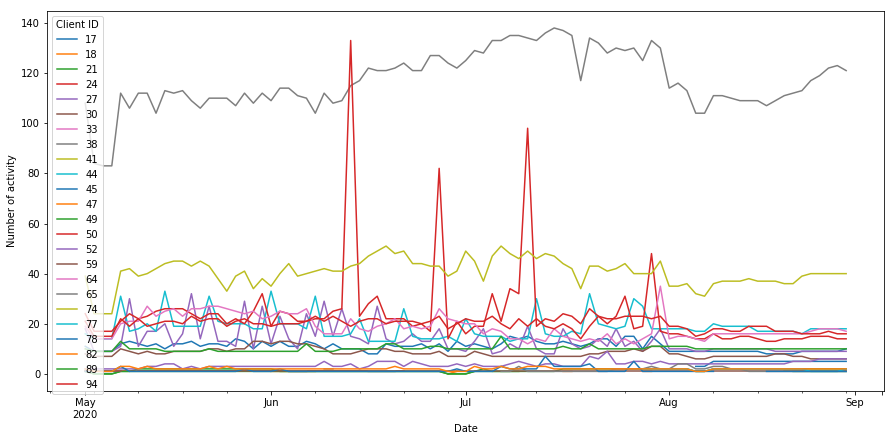

In [138]:
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID']).count()['Market Value'].unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Number of activity')

Text(0, 0.5, 'Number of activity')

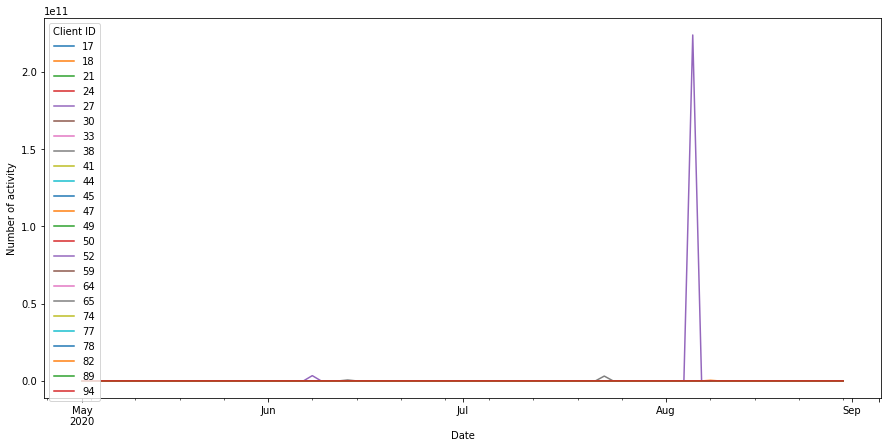

In [139]:
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID'])['Daily_total_value_client'].mean().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Number of activity')

Text(0, 0.5, 'Average market value / customer')

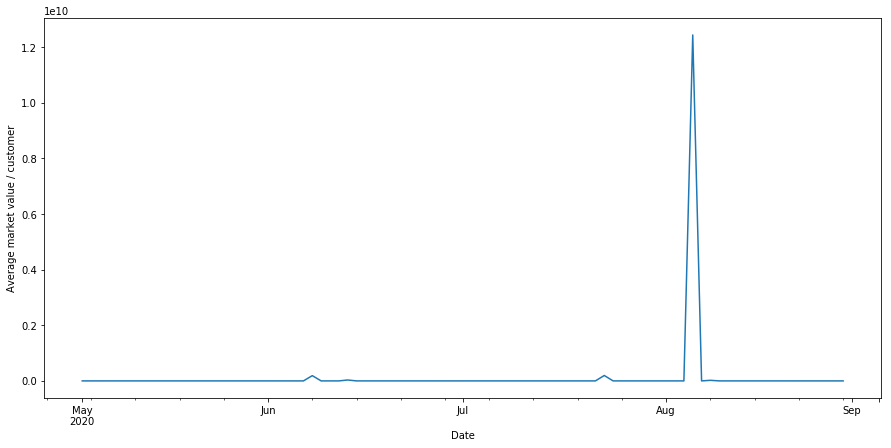

In [140]:
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID'])['Daily_total_value_client'].mean().groupby('Date').mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average market value / customer')

Text(0, 0.5, 'Average activity number / customer')

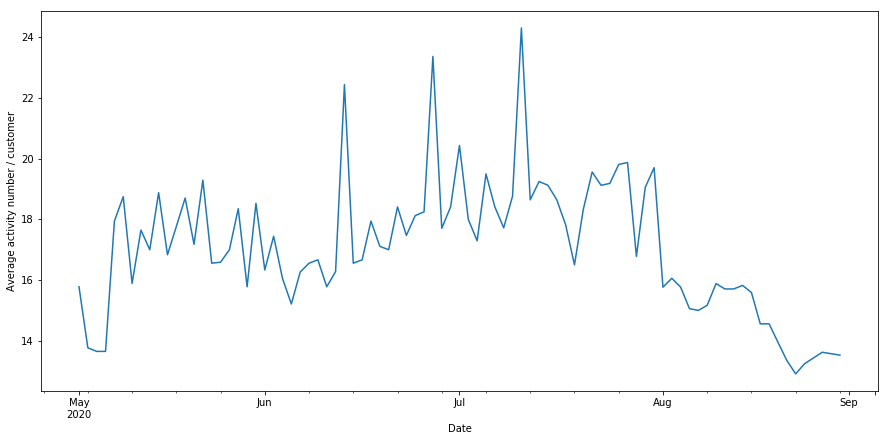

In [141]:
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Client ID'])['Daily_total_value_client'].count().groupby('Date').mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average activity number / customer')

# What potato price trends do you see?
1. the average price per product per day
<br>
Basically the trend of price are steady for most potatoes, but some always have high price(Product ID 11,236,227), rest of them are of low price
2. the average price of potatoes per day
<br>
May-Jun: high volatility
<br>
Jun-Aug: low volatility but high average price
<br>
Aug-Sep: low price valley

Text(0, 0.5, 'Potato Price')

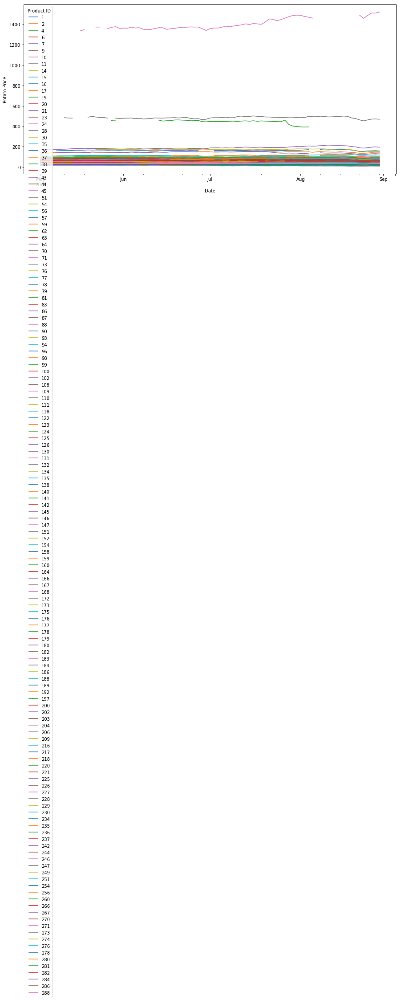

In [143]:
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Product ID'])['Price'].mean().unstack().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Potato Price')

Text(0, 0.5, 'Average potato price')

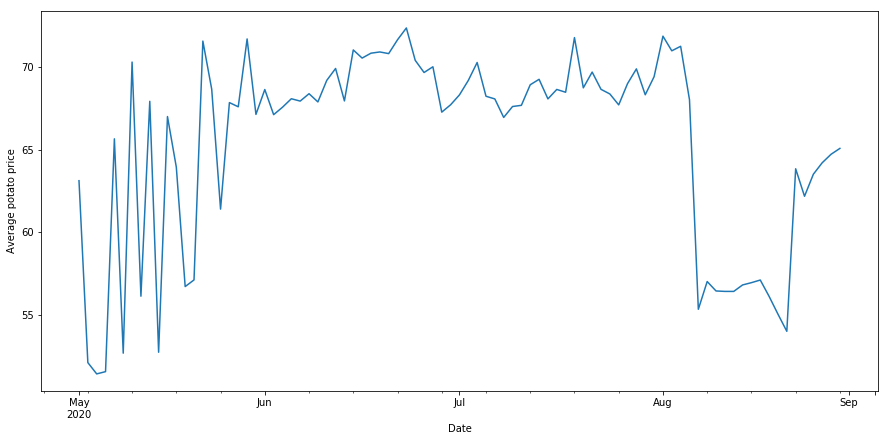

In [29]:
fig, ax = plt.subplots(figsize=(15,7))
position.groupby(['Date','Product ID'])['Price'].mean().groupby('Date').mean().plot(ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Average potato price')

# Are there any factors that can help predict potato prices?

1. Exploratory data analysis
2. Data cleaning
3. Mixed Model
4. Model Evaluation
5. Model Interpretation
<br>
Linear Regression: R-squared not very high but overall coefficients of most factors in potato_info are significant and can be used to predict potato price 
<br>
Linear Mixed Model: in order to further detect if quantity has impact on price, however the result is not significant
<br>
Decision Tree: Provide a ranking of factor importance, and quantity is represented as an important factor

In [144]:
#convert data type to categorical ordinal data
depth={"Very shallow":0,"Very shallow - shallow":1,"Shallow":2,"Shallow - medium":3,
       "Medium":4,"Medium - deep":5,"Deep":6,"Deep - very deep":7,"Very deep":8,"-":4}
maturity={"Very early":0,"Very early to early":1,"Early":2,"First Early":3,"Second Early":4,"Early Maincrop":5,
          "Maincrop":6,"Early to intermediate":7,"Intermediate":8,"Intermediate to late":9,"Late":10,
         "Late Maincrop":11,"Late to very late":12,"Very late":13,"-":6.5}
smoothness={"Rough":0,"Medium":1,"Smooth":2,'-':1}
height={"Very short":0,"Short":1,"Short - medium":2,"Medium":3,"Medium - tall":4,"Tall":5,"Tall - very tall":6,"Very tall":7,"-":3.5}
frequency={"Absent":0,"Few":1,"Medium":2,"Many":3,"Very many":4,'-':2}
fresh={"White":0,"Cream":1,"Light yellow":2,"Medium yellow":3,"Deep yellow":4,"Parti-coloured red":5,"-":2.5}
shape={"Short - oval":0,"Oval":1,"Oval - long":2,"Long":3,"Very long":4,"Round":1.5,"-":2}

potato_info['Depth of eyes']=potato_info['Depth of eyes'].map(depth)
potato_info['Smoothness of skin']=potato_info['Smoothness of skin'].map(smoothness)
potato_info['Maturity']=potato_info['Maturity'].map(maturity)
potato_info['Height of plants']=potato_info['Height of plants'].map(height)
potato_info['Frequency of berries']=potato_info['Frequency of berries'].map(frequency)
potato_info['Shape of tuber']=potato_info['Shape of tuber'].map(shape)
potato_info['Colour of flesh']=potato_info['Colour of flesh'].map(fresh)

for col in ["Country","Colour of skin","Colour of base of lightsprout"]:
    potato_info[col] = potato_info[col].astype('category',copy=False)
for col in list(client_info.columns.values):
    client_info[col] = client_info[col].astype('category',copy=False)
client_info=client_info[['Client ID','Client Type', 'Client Location']]


In [145]:
#Merge three datasets
data=position.merge(potato_info,how="left",left_on='Product ID',right_on='Product ID').merge(client_info,how="left",left_on='Client ID',right_on='Client ID')
data.drop(["Market Value",'Variety Name','Daily_total_value_client','count_client','count_potato'],axis=1,inplace=True, errors='ignore')


<class 'pandas.core.frame.DataFrame'>
Int64Index: 25879 entries, 0 to 25878
Data columns (total 17 columns):
Date                             25879 non-null datetime64[ns]
Client ID                        25879 non-null object
Product ID                       25879 non-null int64
Price                            25666 non-null float64
Quantity                         25879 non-null float64
Country                          25879 non-null category
Shape of tuber                   25879 non-null float64
Colour of skin                   25879 non-null category
Colour of flesh                  25879 non-null float64
Depth of eyes                    25879 non-null int64
Smoothness of skin               25879 non-null int64
Colour of base of lightsprout    25879 non-null category
Maturity                         25879 non-null float64
Height of plants                 25879 non-null float64
Frequency of berries             25879 non-null int64
Client Type                      25879 non-null ca

Date                             0.000000
Client ID                        0.000000
Product ID                       0.000000
Price                            0.000000
Quantity                         0.000000
Country                          0.265891
Shape of tuber                   0.000000
Colour of skin                   0.004173
Colour of flesh                  0.000000
Depth of eyes                    0.000000
Smoothness of skin               0.000000
Colour of base of lightsprout    0.135283
Maturity                         0.000000
Height of plants                 0.000000
Frequency of berries             0.000000
Client Type                      0.000000
Client Location                  0.000000
dtype: float64

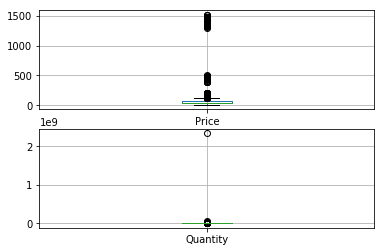

In [146]:
#Exploratory  Data Analysis
#Summary Data
data.info()
data.describe()
plt.subplot(2, 1, 1)
data.boxplot(['Price'])
plt.subplot(2, 1, 2)
data.boxplot(['Quantity'])
data.isin(['-']).sum(axis=0)/data.shape[0]

In [147]:
#remove outliers
data=data[data['Price']<=400]
data=data[data["Quantity"]<int(1E9)]

In [211]:
import statsmodels.api as sm
import scipy.stats as ss
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import train_test_split
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
new=data.drop(["Client ID","Client Type","Client Location"],axis=1)#I think they are uncorrelated with potato price
new.corr()#correlation between numerical data
#new=new.set_index(['Product ID','Date'])

,Product ID,Price,Quantity,Shape of tuber,Colour of flesh,Depth of eyes,Smoothness of skin,Maturity,Height of plants,Frequency of berries
Product ID,1.000000,-0.044789,0.006949,0.048994,-0.152464,-0.171835,0.099361,0.081626,0.013474,-0.042829
Price,-0.044789,1.000000,-0.001589,0.168373,0.139947,-0.188855,-0.110994,-0.107127,0.121712,0.054006
Quantity,0.006949,-0.001589,1.000000,0.006376,-0.006531,0.003119,0.012056,-0.004939,-0.004940,-0.004137
Shape of tuber,0.048994,0.168373,0.006376,1.000000,0.118455,-0.028344,0.099683,0.064548,0.134765,0.038580
Colour of flesh,-0.152464,0.139947,-0.006531,0.118455,1.000000,-0.015428,-0.181926,-0.022548,-0.111670,0.307878
Depth of eyes,-0.171835,-0.188855,0.003119,-0.028344,-0.015428,1.000000,-0.070333,0.214177,0.113059,-0.229219
Smoothness of skin,0.099361,-0.110994,0.012056,0.099683,-0.181926,-0.070333,1.000000,-0.087988,-0.162504,-0.111172
Maturity,0.081626,-0.107127,-0.004939,0.064548,-0.022548,0.214177,-0.087988,1.000000,0.419388,0.041381
Height of plants,0.013474,0.121712,-0.004940,0.134765,-0.111670,0.113059,-0.162504,0.419388,1.000000,-0.110880
Frequency of berries,-0.042829,0.054006,-0.004137,0.038580,0.307878,-0.229219,-0.111172,0.041381,-0.110880,1.000000


In [225]:
new_group=new.groupby(['Product ID','Date', 'Price']).agg({'Quantity':sum, 'Country':'first', 
                                                           'Shape of tuber':'first','Colour of skin':'first', 
                                                           'Colour of flesh':'first', 'Depth of eyes':'first',
                                                           'Smoothness of skin':'first', 
                                                           'Colour of base of lightsprout':'first', 
                                                           'Maturity':'first','Height of plants':'first', 
                                                           'Frequency of berries':'first'})
new=new_group.reset_index()

In [228]:
#Linear Regression 
#create dummy variable
for i in ["Country","Colour of skin","Colour of base of lightsprout"]:
    dummy=pd.get_dummies(new[i])
    new=pd.concat([new,dummy],axis=1)
new=new.drop(["Country","Colour of skin","Colour of base of lightsprout"],axis=1)

In [230]:
new=new.set_index(['Product ID','Date'])
X = new.iloc[:,1:]
y = new['Price'].apply(np.log)
X = sm.add_constant(X)
model = sm.OLS(y, X).fit() 
y_lr_predict = model.predict(X)
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  Price   R-squared:                       0.181
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     83.84
Date:                Wed, 06 Mar 2019   Prob (F-statistic):               0.00
Time:                        08:39:18   Log-Likelihood:                -8336.7
No. Observations:               10630   AIC:                         1.673e+04
Df Residuals:                   10601   BIC:                         1.694e+04
Df Model:                          28                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
const                    2.6175      0.028     94.243      0.000       2.563       2.672
Quantity               2.11e-09   6.19e-09      0.341      0.733      -1e-08    1.42e-08
Shape of tuber           0.0415      0.006      6.828      0.000       0.030       0.053
Colour of flesh          0.0820      0.006     13.471      0.000       0.070       0.094
Depth of eyes           -0.1202      0.005    -25.581      0.000      -0.129      -0.111
Smoothness of skin       0.0573      0.012      4.721      0.000       0.033       0.081
Maturity                 0.0097      0.002      4.541      0.000       0.005       0.014
Height of plants         0.0626      0.006     11.070      0.000       0.052       0.074
Frequency of berries     0.0296      0.007      4.281      0.000       0.016       0.043
-                        0.2740      0.018     15.512      0.000       0.239       0.309
AFGHANISTAN              0.3198      0.055      5.813      0.000       0.212       0.428
AUSTRIA                  0.0753      0.079      0.949      0.342      -0.080       0.231
CANADA                   1.0123      0.057     17.832      0.000       0.901       1.124
FRANCE                   0.2082      0.031      6.776      0.000       0.148       0.268
GERMANY                 -0.2123      0.075     -2.847      0.004      -0.358      -0.066
IRELAND                 -0.0342      0.023     -1.488      0.137      -0.079       0.011
NETHERLANDS              0.3460      0.021     16.338      0.000       0.304       0.387
UNITED KINGDOM           0.1483      0.017      8.624      0.000       0.115       0.182
UNITED STATES            0.4801      0.031     15.687      0.000       0.420       0.540
-                        0.3982      0.060      6.673      0.000       0.281       0.515
Blue                     0.7419      0.041     18.246      0.000       0.662       0.822
Blue parti-coloured      0.7430      0.041     17.923      0.000       0.662       0.824
Cream                    0.0602      0.017      3.644      0.000       0.028       0.093
Red                      0.0006      0.019      0.034      0.973      -0.036       0.037
Red parti-coloured       0.1400      0.019      7.490      0.000       0.103       0.177
White                    0.2133      0.015     14.281      0.000       0.184       0.243
Yellow                   0.3203      0.019     16.646      0.000       0.283       0.358
-                        0.4677      0.018     25.712      0.000       0.432       0.503
Absent                   0.4481      0.031     14.393      0.000       0.387       0.509
Blue                     0.4341      0.017     26.212      0.000       0.402       0.467
Pink                     0.6234      0.012     50.626      0.000       0.599       0.648
Violet                   0.6441      0.020     32.385    

In [231]:
errors = abs(y_lr_predict  - y)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
meanSquaredError=mean_squared_error(y, y_lr_predict)
print("MSE:", meanSquaredError)
rootMeanSquaredError = sqrt(meanSquaredError)
print("RMSE:", rootMeanSquaredError)

Mean Absolute Error: 0.41 degrees.
MSE: 0.2810152587939381
RMSE: 0.5301087235595525


In [234]:
#Linear Mixed Model
import statsmodels.api as sm
import statsmodels.formula.api as smf
new=new.reset_index()
md = smf.mixedlm("Price ~ Quantity", new, groups=new["Product ID"])
mdf = md.fit()
print(mdf.summary())

          Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: Price      
No. Observations: 10630   Method:             REML       
No. Groups:       145     Scale:              10.5715    
Min. group size:  4       Likelihood:         -28307.8389
Max. group size:  87      Converged:          Yes        
Mean group size:  73.3                                   
---------------------------------------------------------
              Coef.   Std.Err.   z    P>|z| [0.025 0.975]
---------------------------------------------------------
Intercept      54.296    3.508 15.478 0.000 47.421 61.171
Quantity        0.000    0.000  1.419 0.156 -0.000  0.000
groups RE    1784.036   64.927                           



In [182]:
#Decision Tree
from sklearn import preprocessing
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report
from sklearn import utils
from sklearn.metrics import mean_squared_error
from math import sqrt
New=data.drop(['Client ID','Client Type','Client Location'],axis=1)
New=New.set_index('Product ID','Date')
lab_enc = preprocessing.LabelEncoder()
New['Colour of base of lightsprout'] = lab_enc.fit_transform(New['Colour of base of lightsprout'])
New['Colour of skin'] = lab_enc.fit_transform(New['Colour of skin'])
New['Country']=lab_enc.fit_transform(New['Country'])
X=New.iloc[:,2:]
y=New['Price']
encoded = lab_enc.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, encoded, test_size=0.33, random_state=42)
dtc = DecisionTreeClassifier(criterion = "gini", random_state = 100, min_samples_leaf=5)
dtc.fit(X_train, y_train)
y_dtc_pred=dtc.predict(X_test) 

In [172]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(dtc, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [183]:
errors = abs(y_dtc_pred  - y_test)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
meanSquaredError=mean_squared_error(y_test, y_dtc_pred)
print("MSE:", meanSquaredError)
rootMeanSquaredError = sqrt(meanSquaredError)
print("RMSE:", rootMeanSquaredError)
important_feature=pd.DataFrame({"feature":X_test.columns,"importance":dtc.feature_importances_})
important_feature.sort_values("importance",ascending=False,inplace=False).head(10)

Mean Absolute Error: 163.65 degrees.
MSE: 78342.28984989278
RMSE: 279.8969271890865


,feature,importance
0,Quantity,0.838139
8,Maturity,0.025749
2,Shape of tuber,0.021591
5,Depth of eyes,0.020190
7,Colour of base of lightsprout,0.019143
9,Height of plants,0.017821
10,Frequency of berries,0.014939
3,Colour of skin,0.013175
1,Country,0.011409
4,Colour of flesh,0.011358


# Are there any factors that can help predict client activity? 
predict the quantity for certain potato
<br>
Decision Tree: Price,Client Type, Client Location

In [194]:
new1=data[['Date','Client ID','Product ID','Price','Quantity','Client Type','Client Location']]
new1['Product ID']=new1['Product ID'].astype('category')
new1=new1.set_index(['Client ID','Date'])

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [201]:
X=new1[['Product ID','Price','Client Type','Client Location']]
y=new1['Quantity']
lab_enc = preprocessing.LabelEncoder()
encoded = lab_enc.fit_transform(y)
new1['Client Type'] = lab_enc.fit_transform(new1['Client Type'])
new1['Client Location'] = lab_enc.fit_transform(new1['Client Location'])
X_train, X_test, y_train, y_test = train_test_split(X, encoded, test_size=0.33, random_state=42)
dtc = DecisionTreeClassifier(criterion = "gini", random_state = 100, min_samples_leaf=5)
dtc.fit(X_train, y_train)
y_dtc_pred=dtc.predict(X_test) 

In [202]:
errors = abs(y_dtc_pred  - y_test)
print('Mean Absolute Error:', round(np.mean(errors), 2), 'degrees.')
meanSquaredError=mean_squared_error(y_test, y_dtc_pred)
print("MSE:", meanSquaredError)
rootMeanSquaredError = sqrt(meanSquaredError)
print("RMSE:", rootMeanSquaredError)
important_feature=pd.DataFrame({"feature":X_test.columns,"importance":dtc.feature_importances_})
important_feature.sort_values("importance",ascending=False,inplace=False).head(10)

Mean Absolute Error: 400.83 degrees.
MSE: 611768.7580414582
RMSE: 782.1564792555631


,feature,importance
1,Price,0.657612
0,Product ID,0.241647
2,Client Type,0.055147
3,Client Location,0.045594
